# Data Exploring

Data Exploration or Exploratory Data Analysis(EDA) aims that 
- detection of the patterns in the dataset depending on the univariate, bivariate and multivariate features.
- determine which feature has a bigger impact on the target feature or on the result, solution.
- determine how correlated the features are with each other.
- recognize and reduce the errors in the dta.


EDA can be proceduralized as follows;
1. <a href='#univariate_analysis_section'><b>Univariate Analysis</b></a><br>
    1.1 <a href='#central_tendency_univariate_analysis_section'><b>Univariate Central Tendency Analysis</b></a><br>
    1.2 <a href='#variability_univariate_analysis_section'><b>Univariate Measure Of Variability Analysis</b></a><br>
    1.3 <a href='#distribution_univariate_analysis_section'><b>Univariate Frequency Distribution Analysis</b></a><br><br>
    
2. <a href='#bivariate_analysis_section'><b>Bivariate Analysis</b></a><br>
    2.1 <a href='#num_num_bivariate_analysis_section'><b>(Numeric - Numeric) Bivariate Analysis</b></a><br>
    2.2 <a href='#num_cat_bivariate_analysis_section'><b>(Numeric - Categorical) Bivariate Analysis</b></a><br>
    2.3 <a href='#cat_cat_bivariate_analysis_section'><b>(Categorical - Categorical) Bivariate Analysis</b></a><br><br>
    
3. <a href='#multivariate_analysis_section'><b>Multivariate Analysis</b></a><br><br>

4. <a href='#data_storing_section'><b>Data Storing</b></a><br><br>

---

## Data Read

In [1]:
# Import necessary libraries for data obtaining
import pandas as pd

In [39]:
cleaned_data = pd.read_csv('CO_NOx_Emissions.csv')

In [40]:
cleaned_data.columns

Index(['AT', 'AP', 'AH', 'AFDP', 'GTEP', 'TIT', 'TAT', 'TEY', 'CDP', 'CO',
       'NOX'],
      dtype='object')

In [41]:
cleaned_data.shape

(36733, 11)

---

<a id='univariate_analysis_section'></a>
## 1. Univariate Analysis

In this section, each feature in the dataset is explored one by one without considering any correlation between these features **by using descriptive statistics**.

<a id='central_tendency_univariate_analysis_section'></a>
### 1.1 Univariate Central Tendency Analysis

As it can be understood from the name of this subsection, methods used in here are used to describe the center or average of the feature.<br>

[Methods Used In This Subsection: **Mean, Mode, Median**]<br>
**Mean** ---> It is used to obtain average value of the column.<br>
**Mode** ---> It is used to obtain most frequently occurring data in the column.<br>
**Median** ---> It is used to obtain the data in the central point of the column.

In [5]:
# Means of the numerical features are found
mean = cleaned_data.mean(numeric_only=True)
mean = pd.DataFrame(data={'Mean':mean}).transpose()
mean

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
Mean,17.712726,1013.070165,77.867015,3.925518,25.563801,1081.428084,546.158517,133.506404,12.060525,2.372468,65.293067


In [7]:
# Modes of the each features are found
mode = cleaned_data.mode().rename(index={0:'Mode'})
mode

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
Mode,11.920,1012.1,100.12,3.2115,24.308,1100.0,550.01,133.78,11.891,0.11124,60.38
1,18.525,NaN,100.14,4.0076,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,23.969,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
# Medians of the numerical features are found
median = cleaned_data.median(numeric_only=True)
median = pd.DataFrame(data={'Median':median}).transpose()
median

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
Median,17.801,1012.6,80.47,3.9377,25.104,1085.9,549.88,133.73,11.965,1.7135,63.849


<a id='variability_univariate_analysis_section'></a>
### 1.2 Univariate Measure Of Variability Analysis

Aim of this subsection is to understand how the data points are spread out the dataset.<br><br>


[Methods Used In This Subsection: **Range**, **InterQuartile Range(IQR)**, **Skewness**, **Kurtosis**, **Standard Deviation**, **Variance**]<br><br>
**Range** ---> It is used to understand between what points the data oscillates, or spread out.<br><br>
**InterQuartile Range(IQR)** ---> It is the difference between the third quartile(Q3) and first quartile(Q1). And, it expresses the middle half of the column values. Therefore, it is used to understand values in a column have a normal distribution or have skewed distribution.<br><br>
**Skewness** ---> It is used to understand how the values distributed around the mean,median, mode values.<br>
Skewness = [-0.5,0.5] ======> nearly symmetrical data distribution<br>
Skewness = [-1,-0.5] ======> slightly negative skewed data distribution<br>
Skewness = [0.5, 1] ======> slightly positive skewed data distribution<br>
Skewness < -1 ======> extremely negative skewed data distribution<br>
Skewness > 1 ======> extremely positive skewed data distribution<br><br>
**Kurtosis** ---> It is used to understand how many data are in the tail and how the peakness of the data distribution.<br>
Fisher definition is accepted for the kurtosis criteria. Also, it is default in the Scipy library(scipy.stats.kurtosis)<br>
Kurtosis = 0 ==> normally distributed data (**Mesokurtic**)<br>
Kurtosis < 0 ==> thin tailed & flatter distributed data (**Platykurtic**)<br>
Kurtosis > 0 ==> thick tailed & peaked distributed data (**Leptokurtic**)<br><br>
**Standard Deviation** ---> It explains how far each data value is apart from the mean data value on average. Therefore, it is used to understand how the feature values variates around the mean in the column.<br><br>
**Variance** ---> It is squared standard deviation and it explains the degree of spread for a feature in the column.


---

In [4]:
# Import necessary libraries in this subsection
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import iqr, skew, kurtosis

In [10]:
cleaned_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36733 entries, 0 to 36732
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      36733 non-null  float64
 1   AP      36733 non-null  float64
 2   AH      36733 non-null  float64
 3   AFDP    36733 non-null  float64
 4   GTEP    36733 non-null  float64
 5   TIT     36733 non-null  float64
 6   TAT     36733 non-null  float64
 7   TEY     36733 non-null  float64
 8   CDP     36733 non-null  float64
 9   CO      36733 non-null  float64
 10  NOX     36733 non-null  float64
dtypes: float64(11)
memory usage: 3.1 MB


In [11]:
# All column names in the dataset
cleaned_data.columns

Index(['AT', 'AP', 'AH', 'AFDP', 'GTEP', 'TIT', 'TAT', 'TEY', 'CDP', 'CO',
       'NOX'],
      dtype='object')

---

In [26]:
# Statistical characteristics of the features 
for i in cleaned_data.columns:
    # Range of the attribute
    range = (cleaned_data[i].min(), cleaned_data[i].max())
    print('\nRange of the %s attribute: [%d, %d]' % (i, range[0], range[1]))

    # IQR value for the attribute
    print('InterQuartile Range(Q3-Q1) value for the %s attribute: %d' % (i, iqr(cleaned_data[i])))

    # Distribution properties of the attribute 
    print('Skeweness of the %s attribute: %f' % (i, skew(cleaned_data[i])))
    print('Kurtosis of the %s attribute: %f' % (i, kurtosis(cleaned_data[i])))
    print('Standard Deviation of the %s attribute: %f' % (i, cleaned_data[i].std()))
    print('Variance of the %s attribute: %f' % (i, cleaned_data[i].var()))


Range of the AT attribute: [-6, 37]
InterQuartile Range(Q3-Q1) value for the AT attribute: 11
Skeweness of the AT attribute: -0.043545
Kurtosis of the AT attribute: -0.826651
Standard Deviation of the AT attribute: 7.447451
Variance of the AT attribute: 55.464530

Range of the AP attribute: [985, 1036]
InterQuartile Range(Q3-Q1) value for the AP attribute: 8
Skeweness of the AP attribute: 0.194113
Kurtosis of the AP attribute: 0.441770
Standard Deviation of the AP attribute: 6.463346
Variance of the AP attribute: 41.774841

Range of the AH attribute: [24, 100]
InterQuartile Range(Q3-Q1) value for the AH attribute: 21
Skeweness of the AH attribute: -0.628008
Kurtosis of the AH attribute: -0.274716
Standard Deviation of the AH attribute: 14.461355
Variance of the AH attribute: 209.130787

Range of the AFDP attribute: [2, 7]
InterQuartile Range(Q3-Q1) value for the AFDP attribute: 1
Skeweness of the AFDP attribute: 0.381081
Kurtosis of the AFDP attribute: 0.224432
Standard Deviation of t

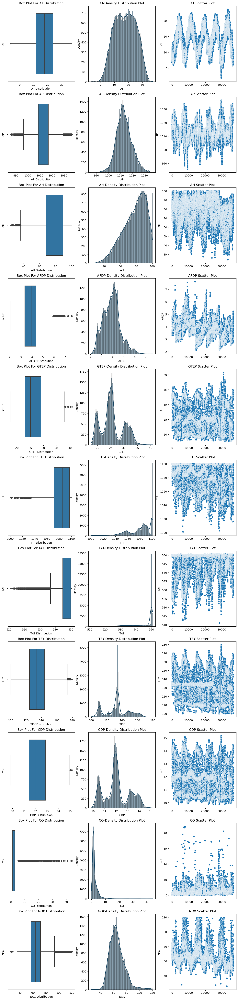

In [6]:
# Graphical Representation of the features
plt.figure(figsize=(15,65))
for i,j in enumerate(cleaned_data.columns):
    # Box PLot for the ith attribute
    plt.subplot(11,3,3*i+1)
    fig = sns.boxplot(x=cleaned_data[j])
    fig.set(xlabel=j+' Distribution', ylabel=j, title='Box Plot For '+j+' Distribution')
    
    # Distribution plot for the ith attribute
    plt.subplot(11,3,3*i+2)
    fig = sns.histplot(cleaned_data[j], kde=True, bins=100, color='#154360')
    fig.set(xlabel=j, ylabel='Density', title=j+'-Density Distribution Plot')

    # Scatter plot for the ith attribute
    plt.subplot(11,3,3*i+3)
    fig = sns.scatterplot(data=cleaned_data, x=cleaned_data.index, y=cleaned_data[j])
    fig.set(title=j+' Scatter Plot')

According to above results;
<br>**AT** —> It has **Platykurtic** and **nearly symmetrical** data distribution characteristic
<br>**AP** —> It has **Leptokurtic** and **nearly symmetrical** data distribution characteristic
<br>**AH** —> It has **Leptokurtic** and **slightly negative skewed** data distribution characteristic
<br>**AFDP** —> It has **Leptokurtic** and **nearly symmetrical** data distribution characteristic
<br>**GTEP** —> It has **Platykurtic** and **nearly symmetrical** data distribution characteristic
<br>**TIT** —> It has **Platykurtic** and **slightly negative skewed** data distribution characteristic
<br>**TAT** —> It has **Leptokurtic** and **extremely negative skewed** data distribution characteristic
<br>**TEY** —> It has **Platykurtic** and **nearly symmetrical** data distribution characteristic
<br>**CDP** —> It has **Platykurtic** and **nearly symmetrical** data distribution characteristic
<br>**CO** —> It has **Leptokurtic** and **extremely positive skewed** data distribution characteristic
<br>**NOX** —> It has **Leptokurtic** and **extremely positive skewed** data distribution characteristic

Below ranges defines the ranges of the features to remove outliers in the dataset; <br>
AT > 0 <br>
990 < AP < 1030 <br>
AH > 30 <br>
AFDP < 6.5 <br>
GTEP < 37 <br>
TIT > 1030 <br>
TAT > 520 <br>
TEY < 170 <br>
CDP < 14.5 <br>
CO < 15 <br>
NOX > 42 <br>

In [43]:
# Outlier Removal
cleaned_data = cleaned_data[cleaned_data.loc[:, 'AT'] > 0]
cleaned_data = cleaned_data[cleaned_data.loc[:, 'AP'] >= 990]
cleaned_data = cleaned_data[(cleaned_data.loc[:, 'AP'] <= 1030)]
cleaned_data = cleaned_data[cleaned_data.loc[:, 'AH'] >= 30]
cleaned_data = cleaned_data[cleaned_data.loc[:, 'AFDP'] <= 6.5]
cleaned_data = cleaned_data[cleaned_data.loc[:, 'GTEP'] <= 37]
cleaned_data = cleaned_data[cleaned_data.loc[:, 'TIT'] >= 1030]
cleaned_data = cleaned_data[cleaned_data.loc[:, 'TAT'] >= 520]
cleaned_data = cleaned_data[cleaned_data.loc[:, 'TEY'] <= 170]
cleaned_data = cleaned_data[cleaned_data.loc[:, 'CDP'] <= 14.5]
cleaned_data = cleaned_data[cleaned_data.loc[:, 'CO'] <= 15]
cleaned_data = cleaned_data[cleaned_data.loc[:, 'NOX'] >= 42]

In [44]:
cleaned_data.shape

(35917, 11)

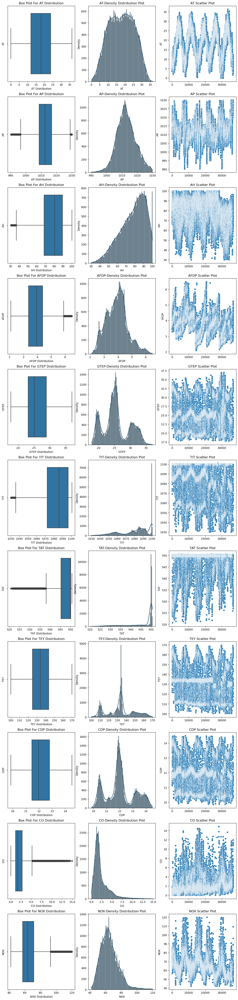

In [45]:
# Graphical Representation of the features
plt.figure(figsize=(15,65))
for i,j in enumerate(cleaned_data.columns):
    # Box PLot for the ith attribute
    plt.subplot(11,3,3*i+1)
    fig = sns.boxplot(x=cleaned_data[j])
    fig.set(xlabel=j+' Distribution', ylabel=j, title='Box Plot For '+j+' Distribution')
    
    # Distribution plot for the ith attribute
    plt.subplot(11,3,3*i+2)
    fig = sns.histplot(cleaned_data[j], kde=True, bins=100, color='#154360')
    fig.set(xlabel=j, ylabel='Density', title=j+'-Density Distribution Plot')

    # Scatter plot for the ith attribute
    plt.subplot(11,3,3*i+3)
    fig = sns.scatterplot(data=cleaned_data, x=cleaned_data.index, y=cleaned_data[j])
    fig.set(title=j+' Scatter Plot')

---

<a id='distribution_univariate_analysis_section'></a>
### 1.3 Univariate Frequency Distribution Analysis

Aim of this subsection is getting insights from the occurrence amount of a column value(frequency distribution). And, there is no predetermined proper statistical, mathematical way. Thus, pie charts, histogram plot etc. can be used.

In [ ]:
# There is no categorical feature in this dataset. Thus, this section is skipped

---

<a id='bivariate_analysis_section'></a>
## 2. Bivariate Analysis

In this section, features are explored by pairs. There might be both categorical and numeric data in the dataset. Thus, every numerical and categorical pair combinations are explored.

In [30]:
from scipy.stats import pearsonr

<a id='num_num_bivariate_analysis_section'></a>
### 2.1 (Numeric - Numeric) Bivariate Analysis

! Correlation exists between numerical values and, Correlation Matrix is explored in this section as Heatmap Plot.<br><br>
**[Used Methods & Plots: Heatmap Plot, Pearson Correlation Coefficient(r) and p-value, Scatter Plot]**<br><br>
**Heatmap Plot** ---> It is used to represent all variables' correlations with each other as a graphical method.<br><br>
**Pearson Correlation Coefficient(r)** ---> It is used to determine linear correlation between two variables.<br>
r = 1    ===> Perfect Positive Correlation<br>
r > 0.5    ===> Positive Strong Correlation<br>
r = (0.3, 0.5]    ===> Positive Moderate Correlation<br>
r = (0, 0.3]    ===> Positive Weak Correlation<br>
r = 0    ===> No Correlation<br>
r = \[-0.3, 0)    ===> Negative Weak Correlation<br>
r = (-0.3, -0.5\]    ===> Negative Moderate Correlation<br>
r = < -0.5 ===> Negative Strong Correlation<br>
r = -1    ===> Perfect Negative Correlation<br><br>
**p-value** ---> It is used to assess the significance of the calculated r value(Pearson Correlation Coefficient).<br>
p-value < 0.05 ===> Correlation is statistically significant<br>
p-value > 0.05 ===> Correlation is **not** statistically significant

---

!!! corr() function calculates the Pearson Correlation Coefficient(r).

Text(0.5, 1.0, 'Correlations Of Features')

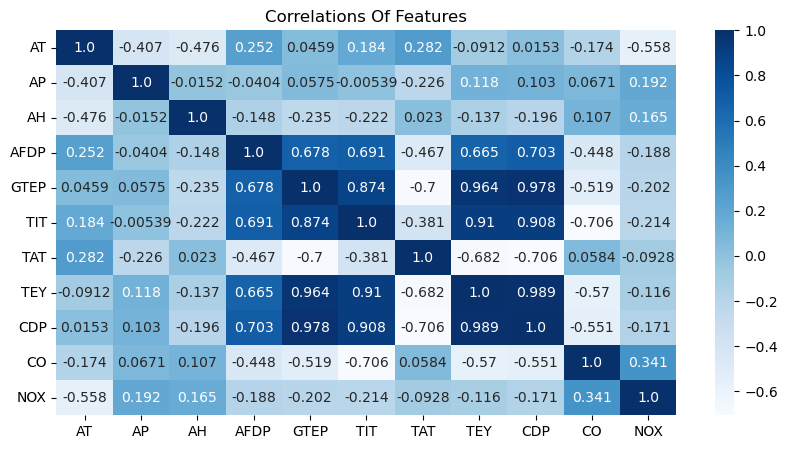

In [34]:
# Plotting Correlation Heatmap of the dataset 
correlation = cleaned_data.corr()
plt.figure(figsize=(10, 5))
sns.heatmap(data=correlation, annot=True, cmap='Blues', fmt='.3')
plt.title('Correlations Of Features')

As it can be seen from above correlation heatmap, <br> 
**AFDP**, **GTEP**, **TIT** **TAT**, **CDP** and **CO** features have high correlation with the **TEY** feature. <br> 
These correalation segments can be heplful for further steps.

---

In [52]:
cleaned_data.columns

Index(['AT', 'AP', 'AH', 'AFDP', 'GTEP', 'TIT', 'TAT', 'TEY', 'CDP', 'CO',
       'NOX'],
      dtype='object')

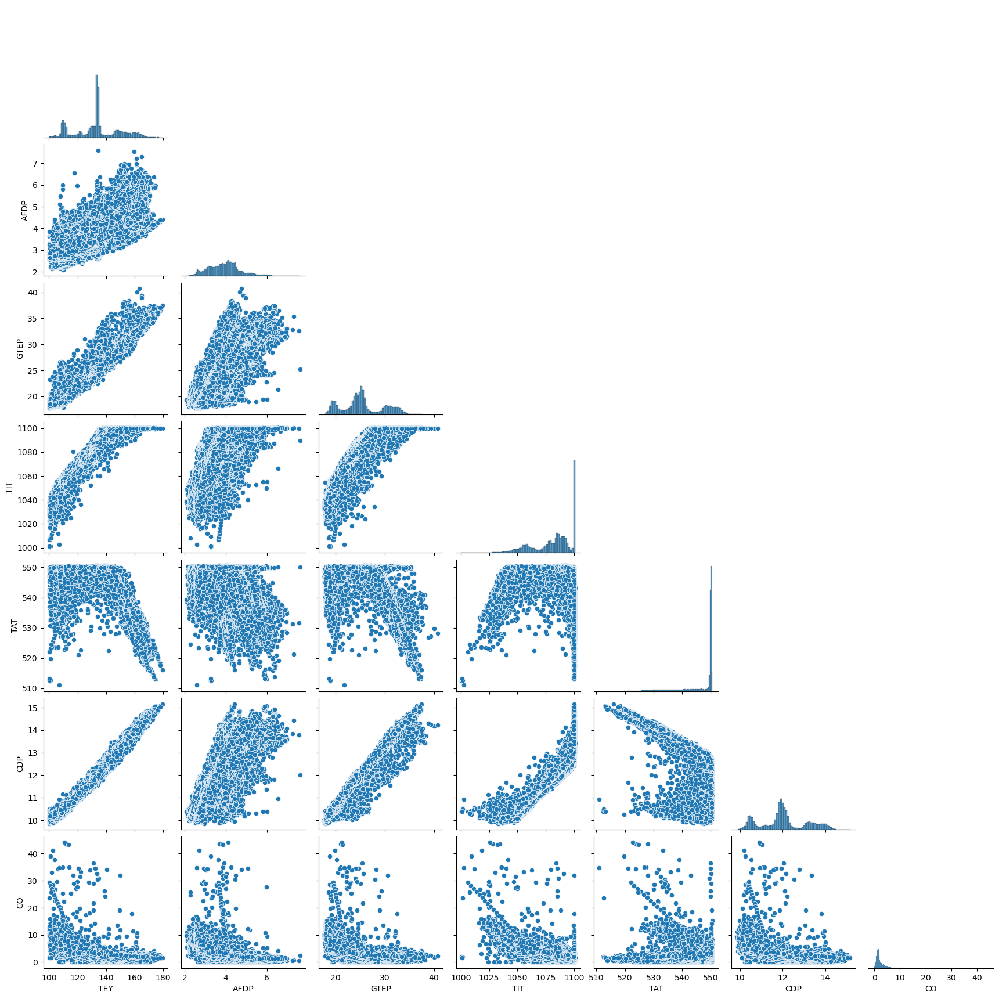

In [53]:
# pair plot for the correlated features with the CO feature
sns.pairplot(cleaned_data.loc[:, ['TEY', 'AFDP', 'GTEP', 'TIT', 'TAT', 'CDP', 'CO']], corner=True)

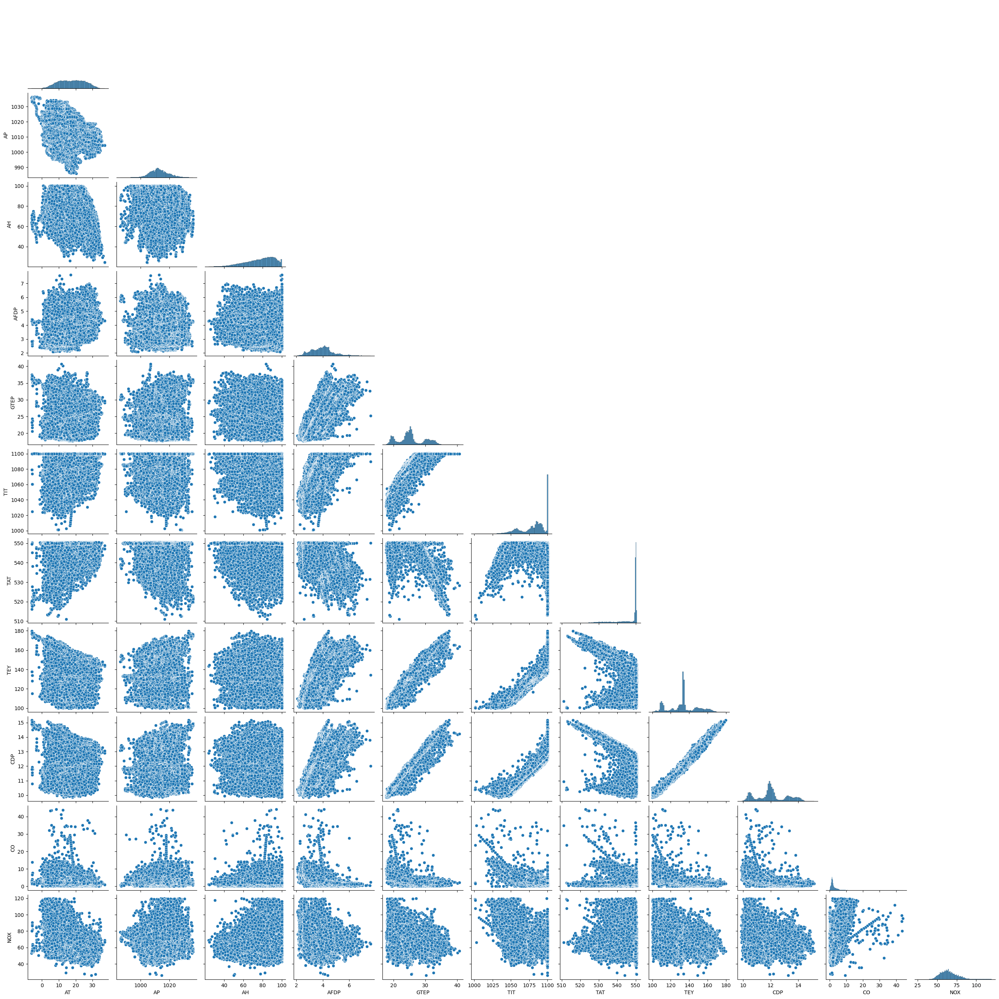

In [47]:
# pair plot for the all features
sns.pairplot(cleaned_data, corner=True)

As the plots shows, there is more pattern shaped data point distribution in the scatter plots if there is considerable correlation. 
In a nutshell, predictor features have more correlation with the **TEY** feature if there is a grouped data in the scatter plot.

---

<a id='num_cat_bivariate_analysis_section'></a>
### 2.2 (Numeric - Categorical) Bivariate Analysis

**[Used Plots & Methods: Box Plot, Violin Plot]**

---

In [ ]:
# There is no categorical feature

---

<a id='cat_cat_bivariate_analysis_section'></a>
### 2.3 (Categorical - Categorical) Bivariate Analysis

In this subsection, only categorical variables are looked for.<br>

**[Used Plots & Methods: Chi-Square Test, GroupBy() Function, Box Plot]**<br>
**Chi-Square Test** ---> It is a statistical test that is used to understand if there is any strong relationship between two categorical variables.<br>

In [ ]:
# There is no categorical feature

<a id='multivariate_analysis_section'></a>
## 3. Multivariate Analysis

In this section, effects of more than two features on the other feature is explored.

In [49]:
# There is no categorical feature
# Thus, investigation of a categorical feature on different features can not be conducted

As it can be seen from the pair plot, there are outliers in the Recency, Frequency and Monetary features.

---

<a id='data_storing_section'></a>
## 4. Data Storing

In [46]:
cleaned_data.to_csv('Cleaned_Data.csv', index=False)

---